# Basic Setup

In [ ]:
# check if GPU has been used
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Select the Runtime > "Change runtime type" menu to enable a GPU accelerator, ')
  print('and then re-execute this cell.')
else:
  print(gpu_info)

Tue Jul 21 12:20:16 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 450.51.05    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   49C    P0    37W / 250W |    417MiB / 16280MiB |      0%      Default |
|                               |                      |                 ERR! |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# check if High-RAM has been used
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('To enable a high-RAM runtime, select the Runtime > "Change runtime type"')
  print('menu, and then select High-RAM in the Runtime shape dropdown. Then, ')
  print('re-execute this cell.')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 27.4 gigabytes of available RAM

You are using a high-RAM runtime!


In [ ]:
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [ ]:
import os
import numpy as np
import pandas as pd
from glob import glob
from itertools import chain
from sklearn.metrics import roc_curve, auc, roc_auc_score, accuracy_score, average_precision_score
from matplotlib import pyplot as plt
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator

import tensorflow as tf

In [ ]:
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [ ]:
# DATA_DIR = '/content/drive/My Drive/Datasets/NIH_chest_xray/NIH_chest_xray_image'
from google.colab import drive
# drive.flush_and_unmount()
drive.mount('/content/gdrive', force_remount=True)
DATA_DIR = "/content/gdrive/My Drive/w210_capstone/balance_set_age_local/"
image_size = 224
batch_size = 32

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive


In [ ]:
df = pd.read_csv("/content/gdrive/My Drive/w210_capstone/Balance_set_age/balance_age.csv", sep='\t')
df.head()

,Unnamed: 0,idx,disease,followup,gender,position,age
0,0,00000001_000.png,Cardiomegaly,0,M,PA,58
1,19,00000005_006.png,Infiltration,6,F,PA,70
2,23,00000008_000.png,Cardiomegaly,0,F,PA,69
3,41,00000013_003.png,Pleural_Thickening,3,M,AP,60
4,47,00000013_009.png,Pleural_Thickening,9,M,AP,60


In [ ]:
data_image_paths = {os.path.basename(x): x for x in glob(os.path.join(DATA_DIR, '*', '*.png'))}
df['path'] = df.idx.map(data_image_paths.get)
df.disease = df.disease.map(lambda x: x.replace('No Finding', 'Normal'))
df = df.dropna(axis=0)
labels = np.unique(df.disease.tolist())
labels = [x for x in labels if len(x) > 0]

In [ ]:
for label in labels:
    if len(label) > 1:
        df[label] = df.disease.map(lambda finding: 1.0 if label in finding else 0.0)

In [ ]:
df.isna().sum()

Unnamed: 0            0
idx                   0
disease               0
followup              0
gender                0
position              0
age                   0
path                  0
Atelectasis           0
Cardiomegaly          0
Consolidation         0
Effusion              0
Infiltration          0
Mass                  0
Nodule                0
Normal                0
Pleural_Thickening    0
dtype: int64

### subset for not loading Normal

In [ ]:
df = df[[i not in ['Normal'] for i in df.disease]]
labels = np.unique(df.disease.tolist())
labels = [x for x in labels if len(x) > 0]


In [ ]:
labels

['Atelectasis',
 'Cardiomegaly',
 'Consolidation',
 'Effusion',
 'Infiltration',
 'Mass',
 'Nodule',
 'Pleural_Thickening']

# prepare train test data

In [ ]:
train_df, valid_df = train_test_split(df, test_size=0.20, random_state=2018)

In [ ]:
train_df['labels'] = train_df.apply(lambda x: x['disease'], axis=1)
valid_df['labels'] = valid_df.apply(lambda x: x['disease'], axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
train_df.disease.value_counts()

Infiltration          1646
Nodule                1609
Atelectasis           1572
Effusion              1565
Mass                  1504
Consolidation          893
Pleural_Thickening     810
Cardiomegaly           767
Name: disease, dtype: int64

In [ ]:
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix
class_weight_list = class_weight.compute_class_weight('balanced', np.unique(train_df.disease.tolist()), train_df.disease.tolist())
class_weight_dict = {i: class_weight_list[i] for i in range(0, len(class_weight_list))}
class_weight_dict

{0: 0.8242684478371501,
 1: 1.689374185136897,
 2: 1.4510078387458007,
 3: 0.8279552715654952,
 4: 0.7872114216281896,
 5: 0.8615359042553191,
 6: 0.805313859540087,
 7: 1.5996913580246914}

In [ ]:
np.unique(train_df.disease.tolist())

array(['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Effusion',
       'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening'],
      dtype='<U18')

In [ ]:
valid_df.disease.value_counts()

Effusion              435
Atelectasis           428
Mass                  422
Nodule                391
Infiltration          354
Consolidation         213
Pleural_Thickening    175
Cardiomegaly          174
Name: disease, dtype: int64

In [ ]:
%%time
core_idg = ImageDataGenerator(rescale=1 / 255,
                                  # samplewise_center=True,
                                  # samplewise_std_normalization=True,
                                  horizontal_flip=True,
                                  vertical_flip=False,
                                  height_shift_range=0.05,
                                  width_shift_range=0.05,
                                  rotation_range=0.5,
                                  shear_range=0.05,
                                  # fill_mode='reflect',
                                  # zoom_range=0.15
                              )

train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                             directory=None,
                                             x_col='path',
                                             y_col='labels',
                                             class_mode='categorical',
                                             batch_size=batch_size,
                                             classes=labels,
                                             target_size=(image_size, image_size))

# valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
#                                              directory=None,
#                                              x_col='path',
#                                              y_col='labels',
#                                              class_mode='categorical',
#                                              batch_size=batch_size,
#                                              classes=labels,
#                                              target_size=(image_size, image_size))

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=valid_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))

Found 10366 validated image filenames belonging to 8 classes.
Found 2592 validated image filenames belonging to 8 classes.
CPU times: user 27.8 s, sys: 2.38 s, total: 30.2 s
Wall time: 14min 48s


In [ ]:
tf.keras.backend.clear_session()

In [ ]:
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint, TensorBoard
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.layers import Dense, Flatten, Activation, Dropout, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from tensorflow.keras.callbacks import EarlyStopping, History, ModelCheckpoint
from tensorflow.keras import optimizers
from tensorflow.keras import Model, Input
from sklearn.utils import class_weight
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import DenseNet121
from tensorflow.keras.models import Sequential
from tensorflow import keras
from tensorflow.keras import layers


# Load the TensorBoard notebook extension.
%load_ext tensorboard

from datetime import datetime
from packaging import version

import tensorflow as tf
import numpy as np

print("TensorFlow version: ", tf.__version__)
assert version.parse(tf.__version__).release[0] >= 2, \
    "This notebook requires TensorFlow 2.0 or above."

TensorFlow version:  2.2.0


In [ ]:
from tensorflow.keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

class MetricsCheckpoint(Callback):

  def __init__(self, savepath):
    super(MetricsCheckpoint, self).__init__()
    self.savepath = savepath
    self.history = {}
      
  def on_epoch_end(self, epoch, logs=None):
    for k, v in logs.items():
        self.history.setdefault(k, []).append(v)
    np.save(self.savepath, self.history)


def plotkerasLearningCurve():
  plt.figure(figsize=(10, 5))
  metrics = np.load('logs.npy', allow_pickle=True)[()]
  filt = ['acc'] # see 'loss'
  for k in filter(lambda x: np.any([kk in x for kk in filt]), metrics.keys()):
    l = np.array(metrics[k])
    plt.plot(l, c='r' if 'val' not in k else 'b', label = 'val' if 'val' in k else 'train')
    x = np.argmin(l) if 'loss' in k else np.argmax(l)
    y = l[x]
    plt.scatter(x, y, lw=0, alpha=0.25, s=100, c='r' if 'val' not in k else 'b')
    plt.text(x, y, '{} = {:.4f}'.format(x,y), size='15', color='r' if 'val' not in k else 'b')
    plt.legend(loc=4)
    plt.axis([0, None, None, None])
    plt.grid()
    plt.xlabel('Number of epochs')
    plt.ylabel('Accuracy')

import itertools

def plotConfusionMatrix(cm, classes, normalize = False, title = 'Confusion Matrix', cmap = plt.cm.Blues):
  plt.figure(figsize=(8, 8))
  plt.imshow(cm, interpolation='nearest', cmap=cmap)
  plt.title = title
  plt.colorbar()
  tick_marks = np.arange(len(classes))
  plt.xticks(tick_marks, classes, rotation=90)
  plt.yticks(tick_marks, classes)
  if normalize:
    cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    print("Normalized confusion matrix")
  else:
    print("Confusion matrix, without nomralization")
  
  fmt = '.2f' if normalize else 'd'
  thresh = cm.max() / 2
  for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
    plt.text(j, i, cm[i, j], horizontalalignment = 'center', color = 'white' if cm[i, j] > thresh else 'black')
  plt.tight_layout()
  plt.ylabel('True label')
  plt.xlabel('Predicted label')


def plotLearningCurve(history):
  plt.figure(figsize=(8, 8))

  plt.subplot(1, 2, 1)
  plt.plot(history.history['binary_accuracy'])
  plt.plot(history.history['val_binary_accuracy'])
  # plt.title('model accuracy')
  plt.ylabel('accuracy')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.savefig('./accuracy_curve.png')

  plt.subplot(1, 2, 2)
  plt.plot(history.history['loss'])
  plt.plot(history.history['val_loss'])
  # plt.title('model loss')
  plt.ylabel('loss')
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.savefig('./loss_curve.png')

### Model 6: remove normal, keep same as fine-tuning best

29089792/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_____________________________

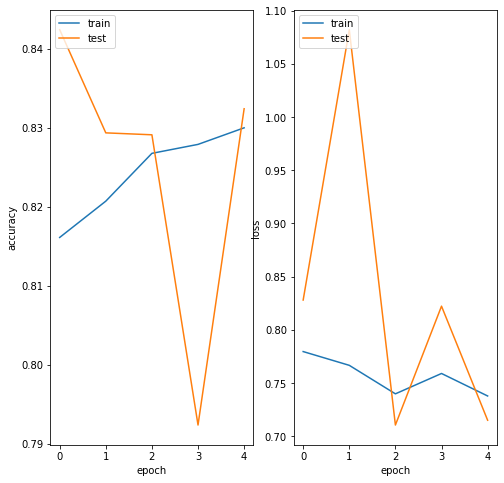

Epoch 1/50
324/324 [==============================] - ETA: 0s - loss: 1.2024 - binary_accuracy: 0.8058 - auc: 0.5777
Epoch 00001: loss improved from inf to 1.20245, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/model_6.h5
324/324 [==============================] - 249s 769ms/step - loss: 1.2024 - binary_accuracy: 0.8058 - auc: 0.5777 - val_loss: 1.1555 - val_binary_accuracy: 0.7860 - val_auc: 0.5561
Epoch 2/50
324/324 [==============================] - ETA: 0s - loss: 0.9088 - binary_accuracy: 0.8169 - auc: 0.6206
Epoch 00002: loss improved from 1.20245 to 0.90880, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/model_6.h5
324/324 [==============================] - 244s 753ms/step - loss: 0.9088 - binary_accuracy: 0.8169 - auc: 0.6206 - val_loss: 0.9509 - val_binary_accuracy: 0.8185 - val_auc: 0.6123
Epoch 3/50
324/324 [==============================] - ETA: 0s - loss: 0.7225 - binary_accuracy: 0.8235 - auc: 0.6440

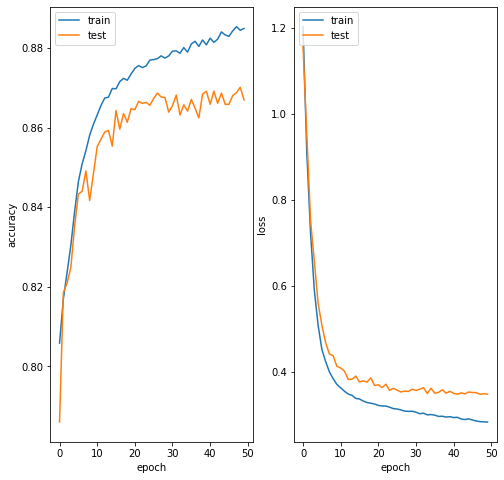

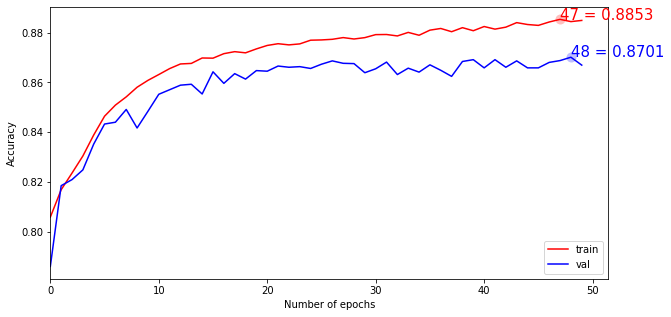

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6/model_6.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers:
   layer.trainable = True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/model_6.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
y_pred4 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred4, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 15.33%, predicted: 10.79%
Cardiomegaly: actual: 6.84%, predicted: 7.23%
Consolidation: actual: 8.30%, predicted: 10.12%
Effusion: actual: 15.43%, predicted: 15.63%
Infiltration: actual: 13.96%, predicted: 16.59%
Mass: actual: 16.21%, predicted: 11.47%
Nodule: actual: 16.70%, predicted: 14.66%
Pleural_Thickening: actual: 7.23%, predicted: 13.61%


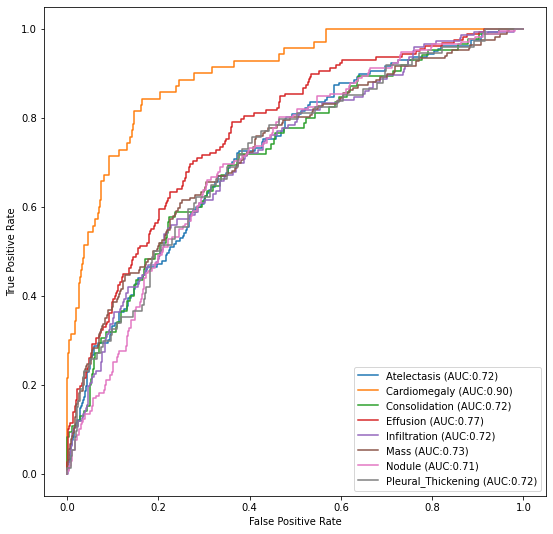

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred4[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred4)))

ROC auc score: 0.748


### 5. only train 8 layers


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_3 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_3[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

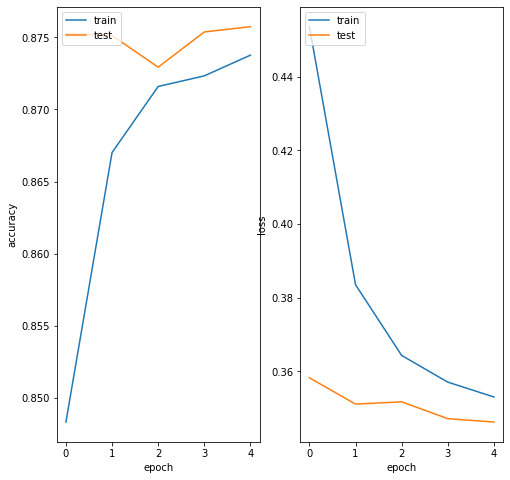

Epoch 1/50
324/324 [==============================] - ETA: 0s - loss: 0.3489 - binary_accuracy: 0.8743 - auc: 0.6941
Epoch 00001: loss improved from inf to 0.34887, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_7p2/model_7.h5
324/324 [==============================] - 249s 768ms/step - loss: 0.3489 - binary_accuracy: 0.8743 - auc: 0.6941 - val_loss: 0.3445 - val_binary_accuracy: 0.8755 - val_auc: 0.7118
Epoch 2/50
324/324 [==============================] - ETA: 0s - loss: 0.3477 - binary_accuracy: 0.8744 - auc: 0.6967
Epoch 00002: loss improved from 0.34887 to 0.34769, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_7p2/model_7.h5
324/324 [==============================] - 248s 766ms/step - loss: 0.3477 - binary_accuracy: 0.8744 - auc: 0.6967 - val_loss: 0.3440 - val_binary_accuracy: 0.8756 - val_auc: 0.7137
Epoch 3/50
324/324 [==============================] - ETA: 0s - loss: 0.3459 - binary_accuracy: 0.8748 - auc: 0.7017

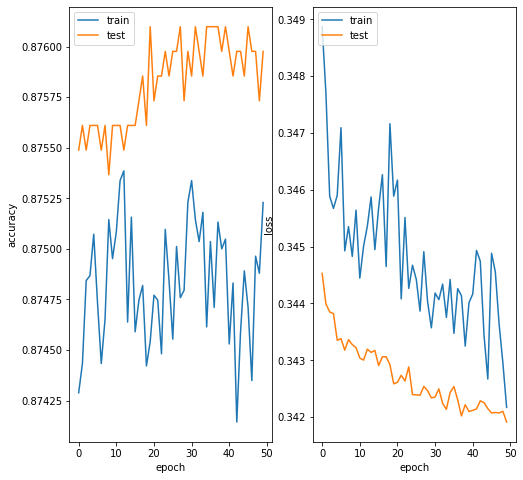

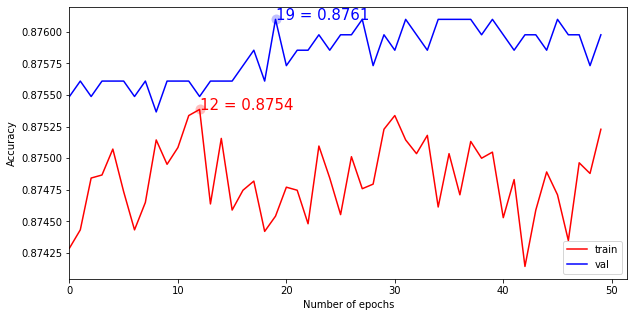

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output

x= tf.keras.layers.GlobalAveragePooling2D()(x)
x= tf.keras.layers.BatchNormalization()(x)
x= tf.keras.layers.Dropout(0.5)(x)
x= tf.keras.layers.Dense(1024,activation='relu')(x) 
x= tf.keras.layers.Dense(512,activation='relu')(x) 
x= tf.keras.layers.BatchNormalization()(x)
x= tf.keras.layers.Dropout(0.5)(x)

output=tf.keras.layers.Dense(len(labels),activation='softmax')(x) #FC-layer
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
# x = tf.keras.layers.Flatten()(x)
# output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
# model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_7/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_7/model_7.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
# for layer in model.layers:
#    layer.trainable = True
for layer in model.layers[:8]:
    layer.trainable=False
    
for layer in model.layers[8:]:
    layer.trainable=True

# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_7p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_7p2/model_7.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
y_pred5 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred5, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.77%, predicted: 12.61%
Cardiomegaly: actual: 5.27%, predicted: 11.38%
Consolidation: actual: 8.50%, predicted: 12.32%
Effusion: actual: 15.92%, predicted: 11.72%
Infiltration: actual: 13.18%, predicted: 12.79%
Mass: actual: 15.92%, predicted: 13.09%
Nodule: actual: 16.02%, predicted: 13.97%
Pleural_Thickening: actual: 7.42%, predicted: 12.12%


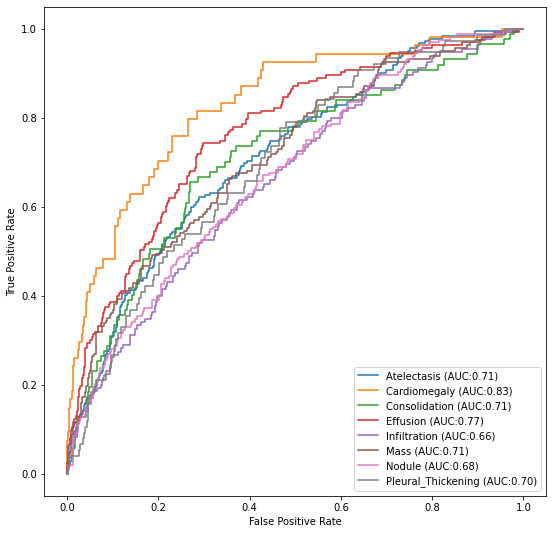

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred5[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred5)))

ROC auc score: 0.721


### train 8 layers No.2

Model: "model_2"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_4 (ZeroPadding2D (None, 230, 230, 3)  0           input_3[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_4[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

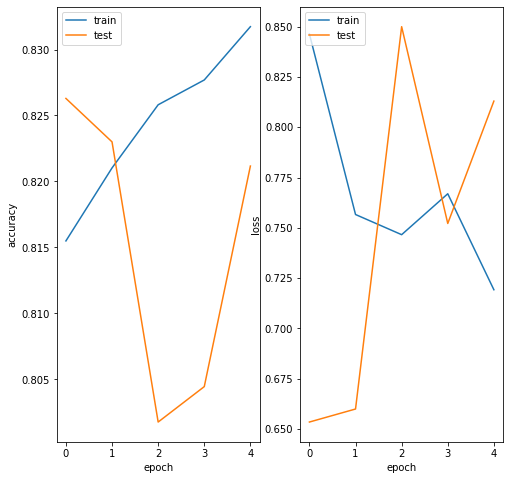

Epoch 1/50
324/324 [==============================] - ETA: 0s - loss: 0.8604 - binary_accuracy: 0.8382 - auc: 0.6915
Epoch 00001: loss improved from inf to 0.86044, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_17p2/model_17.h5
324/324 [==============================] - 295s 910ms/step - loss: 0.8604 - binary_accuracy: 0.8382 - auc: 0.6915 - val_loss: 0.9918 - val_binary_accuracy: 0.8101 - val_auc: 0.6301
Epoch 2/50
324/324 [==============================] - ETA: 0s - loss: 0.7606 - binary_accuracy: 0.8433 - auc: 0.7110
Epoch 00002: loss improved from 0.86044 to 0.76061, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_17p2/model_17.h5
324/324 [==============================] - 290s 896ms/step - loss: 0.7606 - binary_accuracy: 0.8433 - auc: 0.7110 - val_loss: 0.9814 - val_binary_accuracy: 0.8148 - val_auc: 0.6327
Epoch 3/50
324/324 [==============================] - ETA: 0s - loss: 0.7150 - binary_accuracy: 0.8442 - auc: 0.

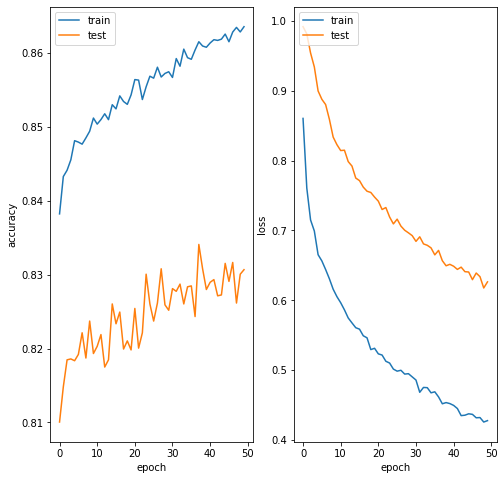

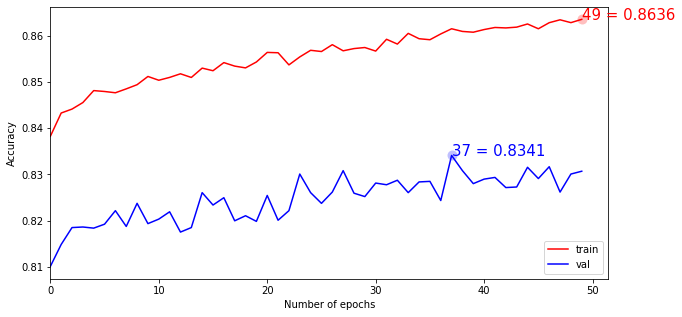

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_17/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_17/model_17.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:-8]:
    layer.trainable=False
    
for layer in model.layers[-8:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_17p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_17p2/model_17.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
model.layers[-8:]

In [ ]:
y_pred6 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred6, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.09%, predicted: 12.65%
Cardiomegaly: actual: 6.84%, predicted: 10.83%
Consolidation: actual: 8.20%, predicted: 11.70%
Effusion: actual: 15.04%, predicted: 14.96%
Infiltration: actual: 13.09%, predicted: 11.49%
Mass: actual: 17.58%, predicted: 12.38%
Nodule: actual: 16.02%, predicted: 14.65%
Pleural_Thickening: actual: 6.15%, predicted: 11.01%


Text(0, 0.5, 'True Positive Rate')

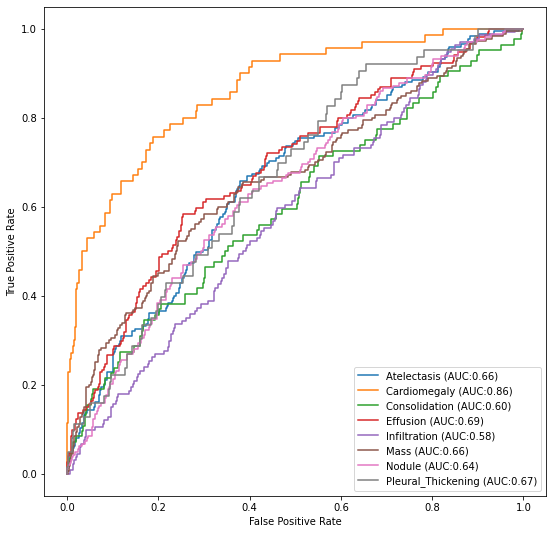

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred6[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
# fig.savefig('trained_net.png')

### train 24 layers

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_2 (ZeroPadding2D (None, 230, 230, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_2[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

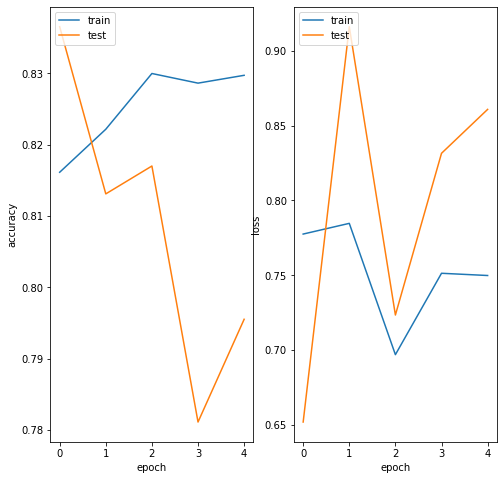

Epoch 1/50
324/324 [==============================] - ETA: 0s - loss: 0.8905 - binary_accuracy: 0.8374 - auc: 0.6879
Epoch 00001: loss improved from inf to 0.89051, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_16p2/model_16.h5
324/324 [==============================] - 293s 903ms/step - loss: 0.8905 - binary_accuracy: 0.8374 - auc: 0.6879 - val_loss: 0.9695 - val_binary_accuracy: 0.8174 - val_auc: 0.6423
Epoch 2/50
324/324 [==============================] - ETA: 0s - loss: 0.7842 - binary_accuracy: 0.8395 - auc: 0.7090
Epoch 00002: loss improved from 0.89051 to 0.78419, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_16p2/model_16.h5
324/324 [==============================] - 291s 898ms/step - loss: 0.7842 - binary_accuracy: 0.8395 - auc: 0.7090 - val_loss: 0.9831 - val_binary_accuracy: 0.8206 - val_auc: 0.6327
Epoch 3/50
324/324 [==============================] - ETA: 0s - loss: 0.7333 - binary_accuracy: 0.8425 - auc: 0.

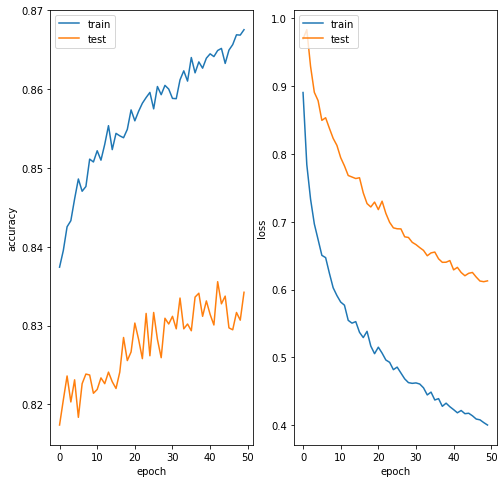

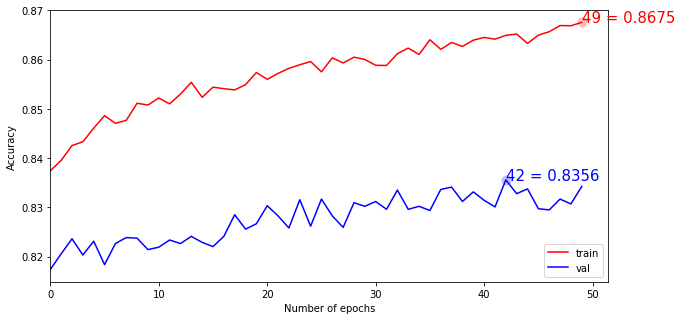

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_16/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_16/model_16.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:-24]:
    layer.trainable=False
    
for layer in model.layers[-24:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_16p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_16p2/model_16.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
y_pred5 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred5, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.09%, predicted: 13.78%
Cardiomegaly: actual: 6.84%, predicted: 8.69%
Consolidation: actual: 8.20%, predicted: 9.19%
Effusion: actual: 15.04%, predicted: 13.14%
Infiltration: actual: 13.09%, predicted: 12.24%
Mass: actual: 17.58%, predicted: 11.37%
Nodule: actual: 16.02%, predicted: 14.47%
Pleural_Thickening: actual: 6.15%, predicted: 13.47%


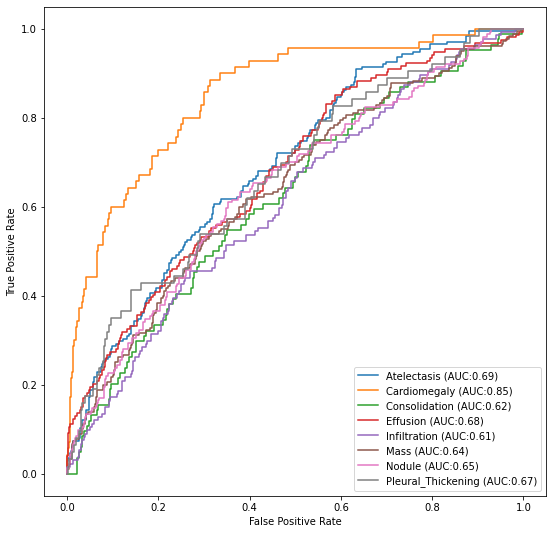

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred5[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

### train 48 layers

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_6 (ZeroPadding2D (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_6[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

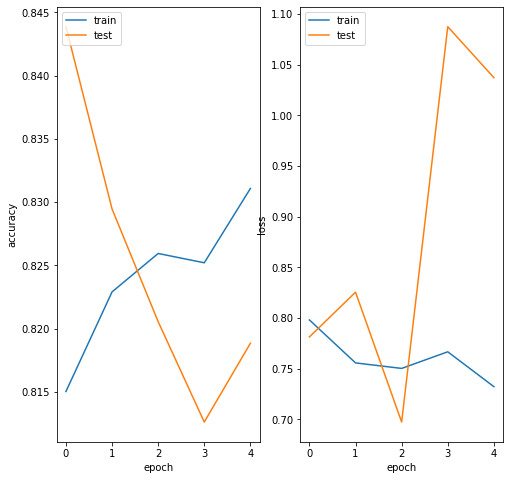

Epoch 1/50
324/324 [==============================] - ETA: 0s - loss: 0.8908 - binary_accuracy: 0.8354 - auc: 0.6778
Epoch 00001: loss improved from inf to 0.89078, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5
324/324 [==============================] - 271s 836ms/step - loss: 0.8908 - binary_accuracy: 0.8354 - auc: 0.6778 - val_loss: 0.9896 - val_binary_accuracy: 0.8113 - val_auc: 0.6337
Epoch 2/50
324/324 [==============================] - ETA: 0s - loss: 0.7808 - binary_accuracy: 0.8393 - auc: 0.7034
Epoch 00002: loss improved from 0.89078 to 0.78082, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5
324/324 [==============================] - 276s 853ms/step - loss: 0.7808 - binary_accuracy: 0.8393 - auc: 0.7034 - val_loss: 0.9728 - val_binary_accuracy: 0.8163 - val_auc: 0.6319
Epoch 3/50
324/324 [==============================] - ETA: 0s - loss: 0.7235 - binary_accuracy: 0.8412 - auc: 0.

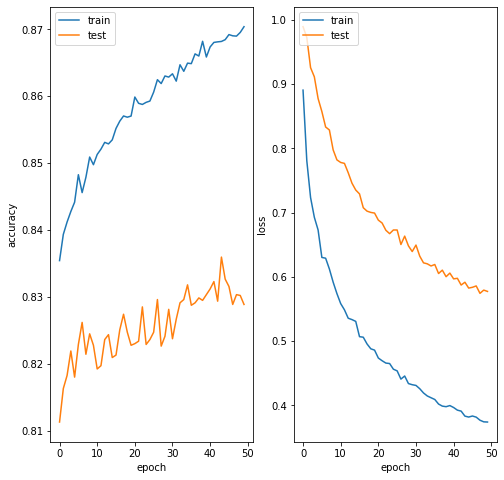

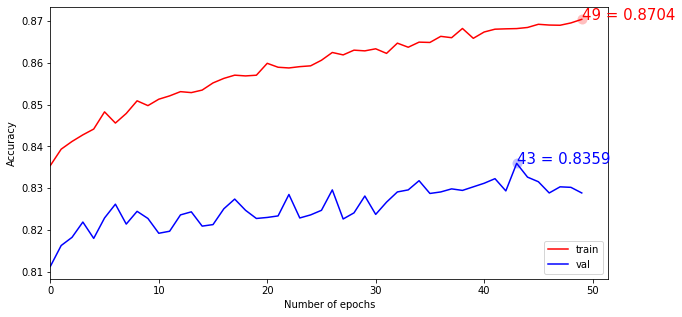

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18/model_18.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:-48]:
    layer.trainable=False
    
for layer in model.layers[-48:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_18p2/model_18.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
y_pred5 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred5, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.09%, predicted: 15.17%
Cardiomegaly: actual: 6.84%, predicted: 11.70%
Consolidation: actual: 8.20%, predicted: 11.44%
Effusion: actual: 15.04%, predicted: 15.84%
Infiltration: actual: 13.09%, predicted: 13.41%
Mass: actual: 17.58%, predicted: 12.81%
Nodule: actual: 16.02%, predicted: 12.00%
Pleural_Thickening: actual: 6.15%, predicted: 10.48%


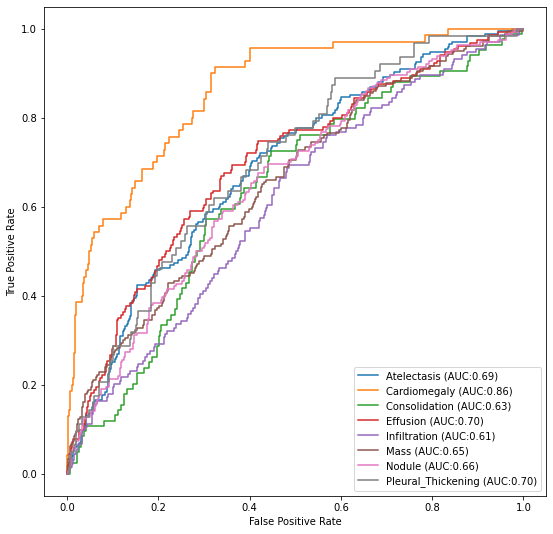

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred5[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

### Model 22: train 48 layers No.2

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

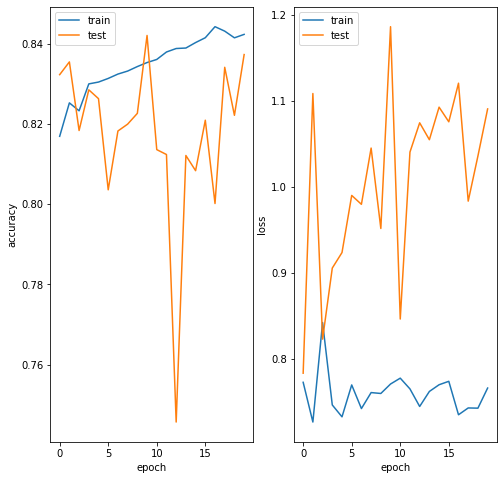

Epoch 1/75
324/324 [==============================] - ETA: 0s - loss: 1.1082 - binary_accuracy: 0.8399 - auc: 0.6885
Epoch 00001: loss improved from inf to 1.10817, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_22p2/model_22.h5
324/324 [==============================] - 293s 906ms/step - loss: 1.1082 - binary_accuracy: 0.8399 - auc: 0.6885 - val_loss: 1.3744 - val_binary_accuracy: 0.8141 - val_auc: 0.6062
Epoch 2/75
324/324 [==============================] - ETA: 0s - loss: 0.9553 - binary_accuracy: 0.8460 - auc: 0.7141
Epoch 00002: loss improved from 1.10817 to 0.95530, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_22p2/model_22.h5
324/324 [==============================] - 290s 894ms/step - loss: 0.9553 - binary_accuracy: 0.8460 - auc: 0.7141 - val_loss: 1.3778 - val_binary_accuracy: 0.8141 - val_auc: 0.6103
Epoch 3/75
324/324 [==============================] - ETA: 0s - loss: 0.8995 - binary_accuracy: 0.8491 - auc: 0.

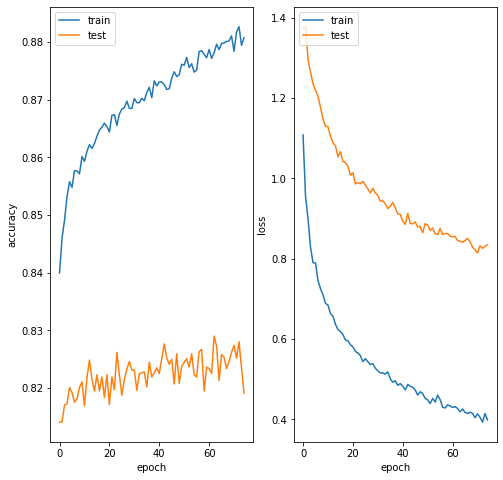

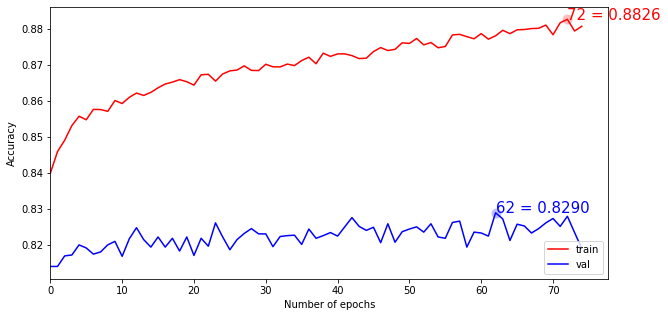

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_22/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_22/model_22.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:-48]:
    layer.trainable=False
    
for layer in model.layers[-48:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_22p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_22p2/model_22.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=75, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_22p2/model_22.h5')

y_pred5 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred5, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.38%, predicted: 13.61%
Cardiomegaly: actual: 6.25%, predicted: 8.00%
Consolidation: actual: 8.30%, predicted: 9.76%
Effusion: actual: 16.89%, predicted: 11.07%
Infiltration: actual: 11.62%, predicted: 11.09%
Mass: actual: 16.89%, predicted: 14.76%
Nodule: actual: 15.53%, predicted: 14.93%
Pleural_Thickening: actual: 7.13%, predicted: 8.36%


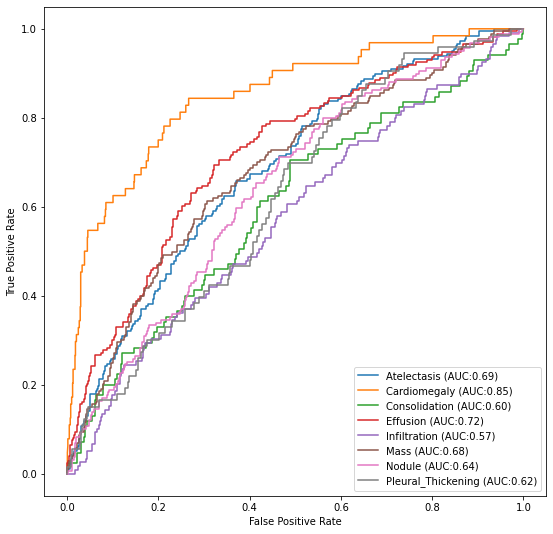

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred5[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

[   0  674  675 ...  349 1022 1023]
1024


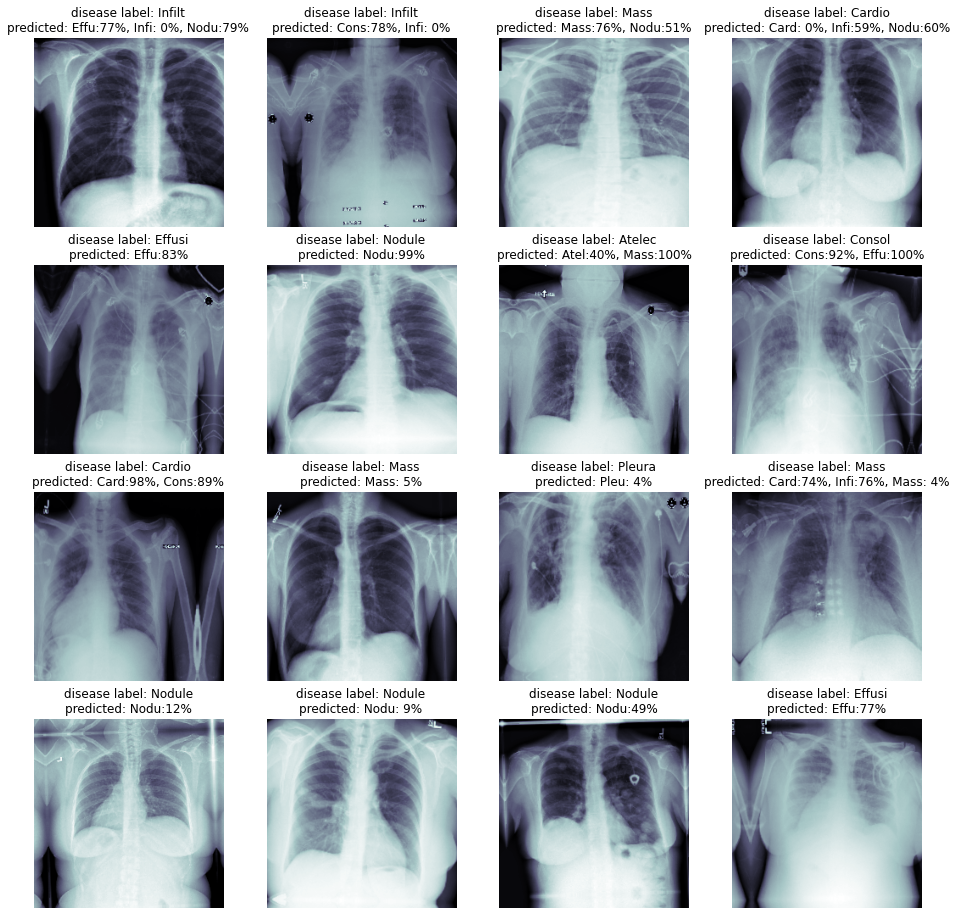

In [ ]:
sickest_idx = np.argsort(np.sum(test_Y, 1)<1)
print(sickest_idx)
print(len(sickest_idx))
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y[idx], y_pred5[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

6600     00011380_015.png
9357     00015558_002.png
7681     00013003_036.png
12063    00019677_001.png
11282    00018444_006.png
10976    00018019_021.png
12872    00021086_005.png
7997     00013592_014.png
15291    00026997_011.png
15932    00028505_006.png
10382    00017110_026.png
16418    00029596_004.png
4903     00008748_010.png
4500     00008008_036.png
7044     00012043_004.png
8032     00013620_020.png
Name: idx, dtype: object
Found 16 validated image filenames belonging to 8 classes.


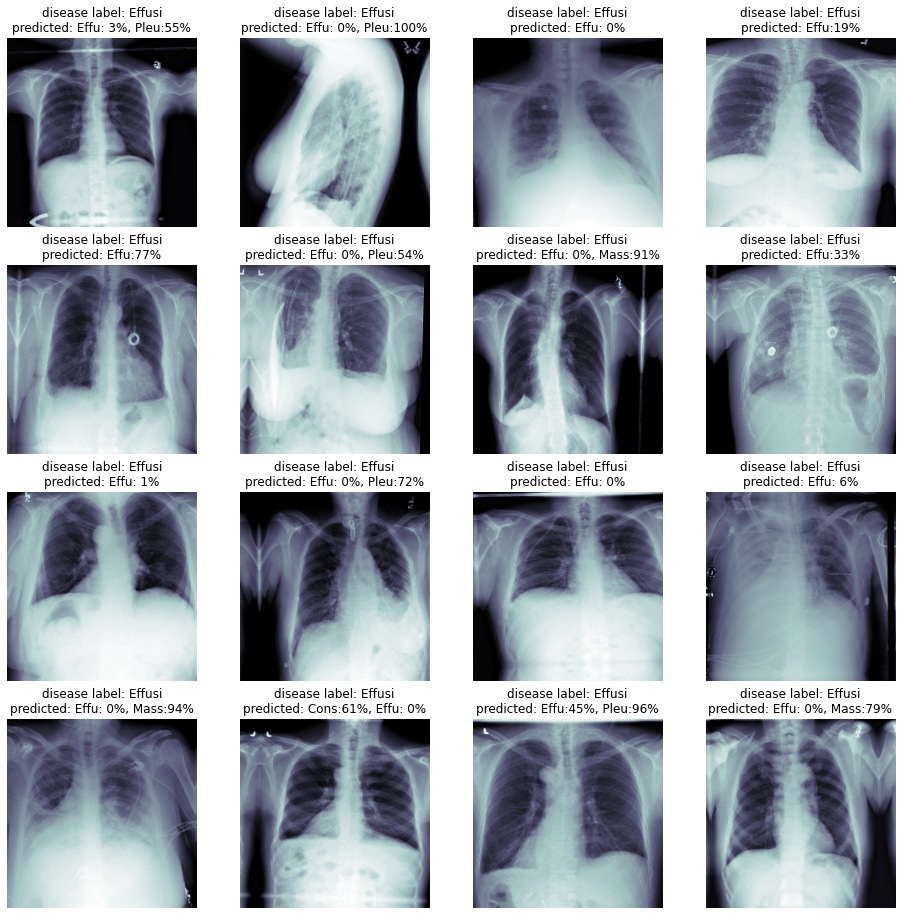

In [ ]:
# for Effusion
valid_df1 = valid_df[valid_df.disease == "Effusion"].sample(n=16, random_state=5)
print(valid_df1.idx.head(16))
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_df1,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
y_pred4 = model.predict(test_X2)

sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X2[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

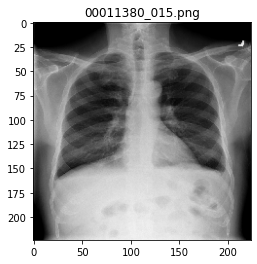

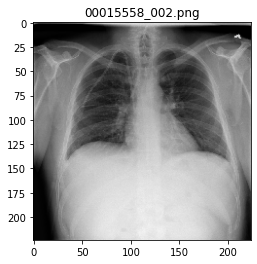

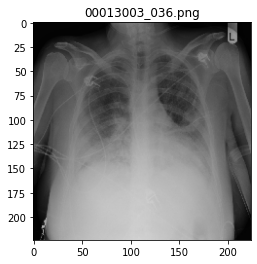

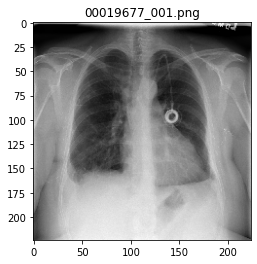

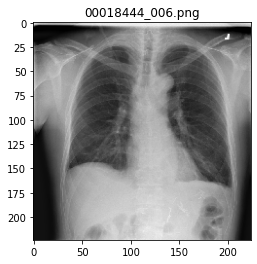

...

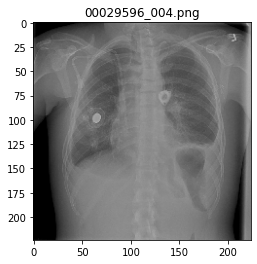

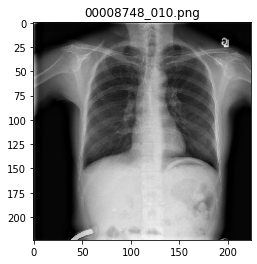

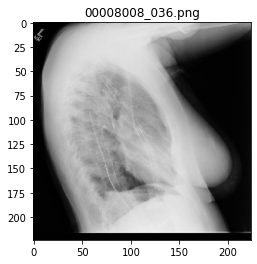

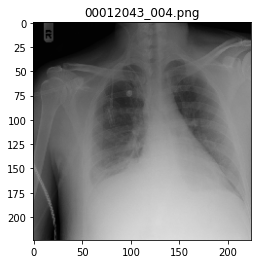

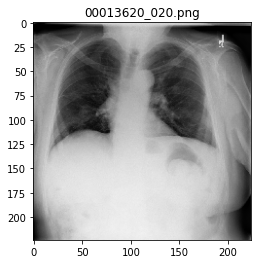

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
for i in range(16):
  _img = load_img(list(valid_df1.path)[i],target_size=(224,224))
  plt.imshow(_img)
  plt.title(list(valid_df1.idx)[i])
  plt.show()

10079    00016673_000.png
8845     00014706_006.png
5133     00009191_000.png
2547     00004843_001.png
7924     00013447_009.png
7165     00012207_000.png
2511     00004809_008.png
16009    00028646_000.png
2624     00004893_073.png
6358     00010970_000.png
7926     00013447_018.png
2559     00004857_011.png
5937     00010454_000.png
371      00000787_002.png
363      00000761_006.png
647      00001373_012.png
Name: idx, dtype: object
Found 16 validated image filenames belonging to 8 classes.


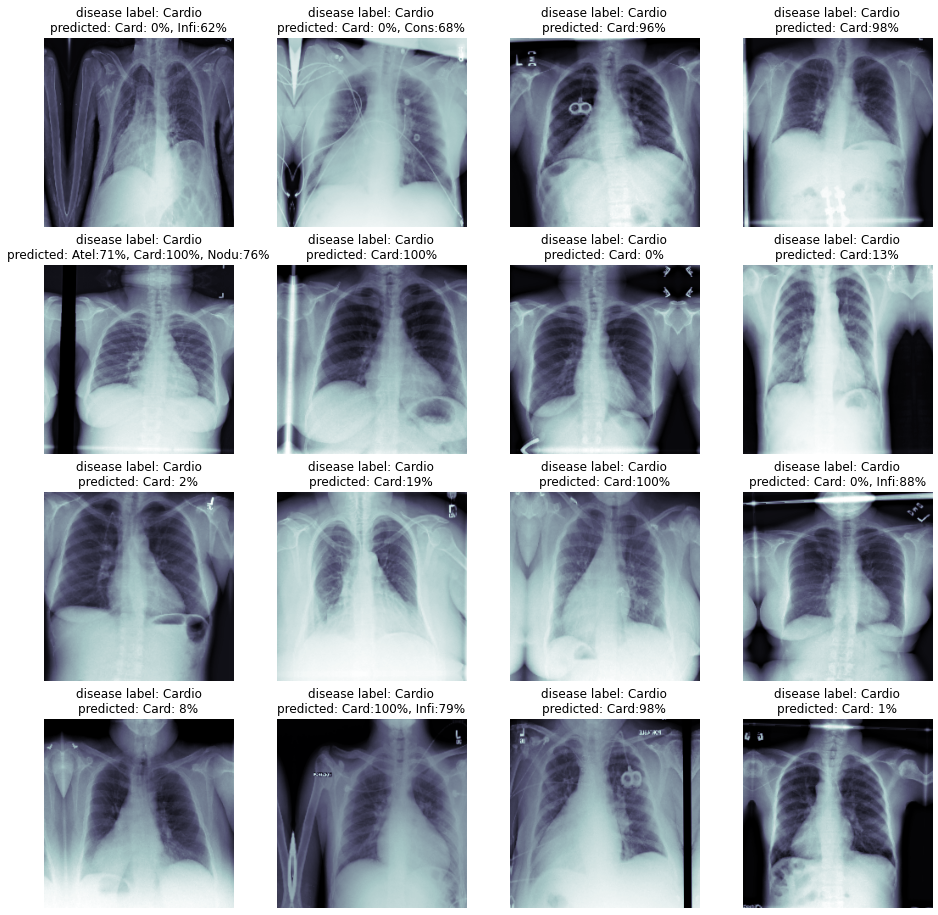

In [ ]:
# for Cardio
valid_df1 = valid_df[valid_df.disease == "Cardiomegaly"].sample(n=16, random_state=5)
print(valid_df1.idx.head(16))
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_df1,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
y_pred4 = model.predict(test_X2)

sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X2[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')

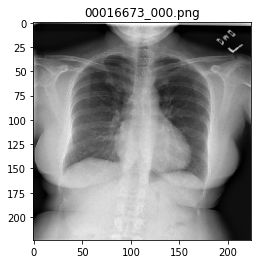

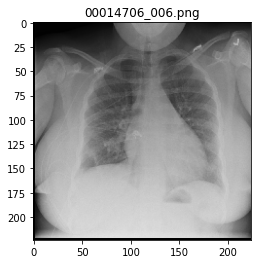

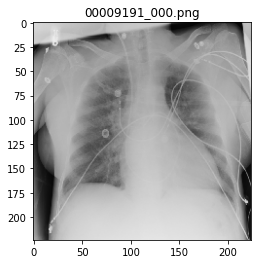

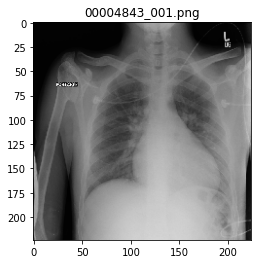

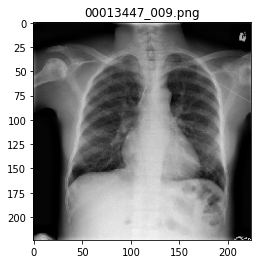

...

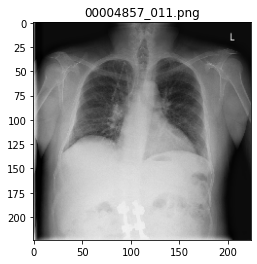

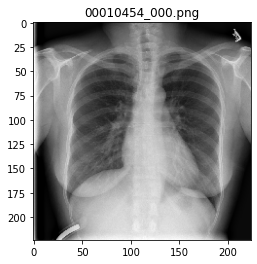

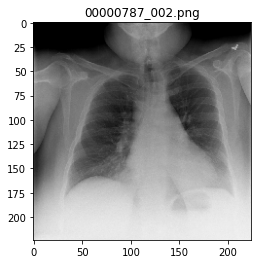

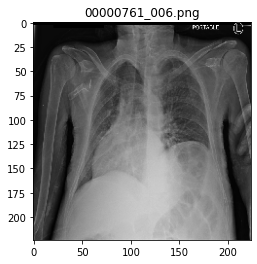

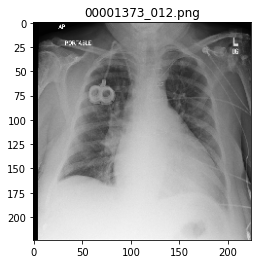

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
for i in range(16):
  _img = load_img(list(valid_df1.path)[i],target_size=(224,224))
  plt.imshow(_img)
  plt.title(list(valid_df1.idx)[i])
  plt.show()

In [ ]:
os.mkdir('/content/gdrive/My Drive/w210_capstone/test_image/Consolidation')

12686    00020673_019.png
14291    00025110_016.png
7738     00013111_032.png
4925     00008793_006.png
9070     00015045_018.png
4896     00008745_026.png
3590     00006517_004.png
5863     00010312_000.png
4269     00007624_032.png
4788     00008518_009.png
625      00001317_007.png
500      00001103_000.png
2758     00005094_009.png
10410    00017138_030.png
12036    00019643_015.png
3505     00006382_004.png
Name: idx, dtype: object
Found 16 validated image filenames belonging to 8 classes.


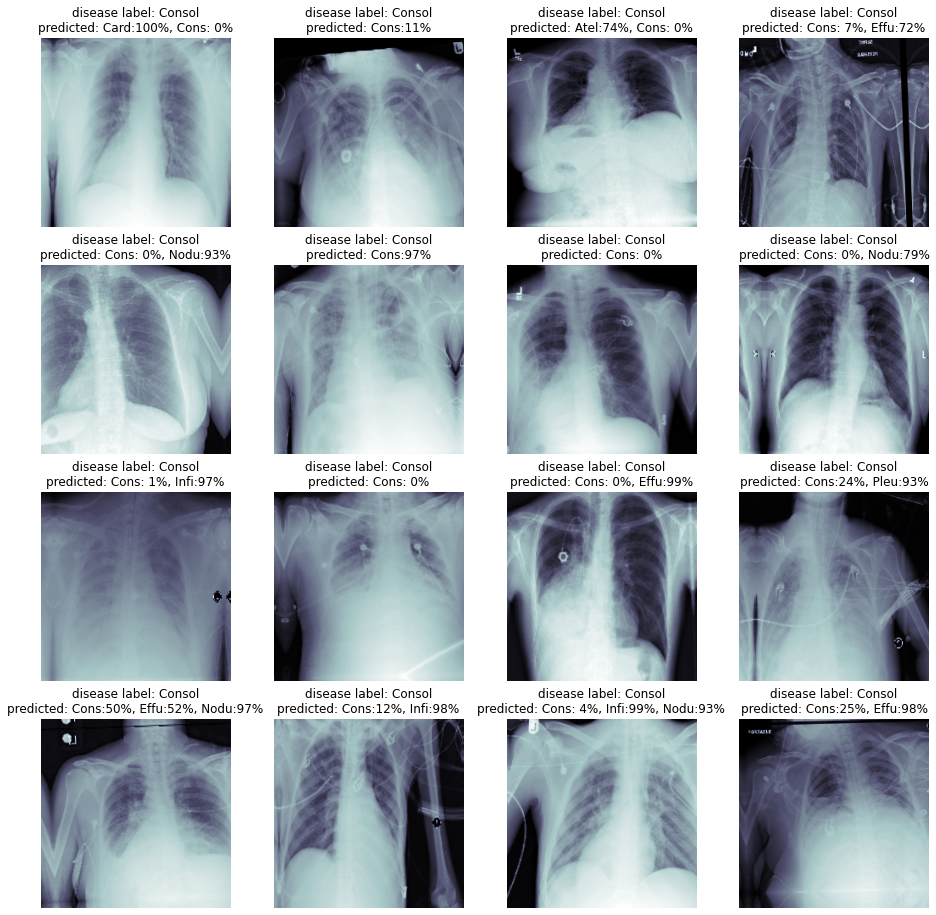

In [ ]:
# for Consolidation
valid_df1 = valid_df[valid_df.disease == "Consolidation"].sample(n=16, random_state=5)
print(valid_df1.idx.head(16))
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_df1,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
y_pred4 = model.predict(test_X2)

sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X2[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')




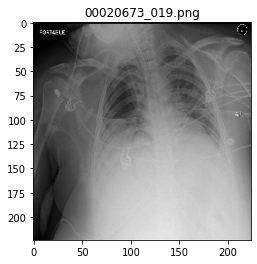

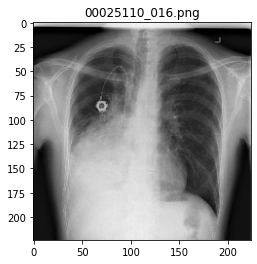

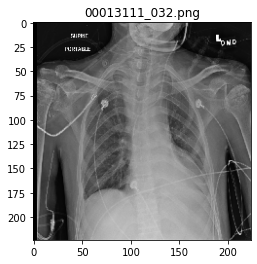

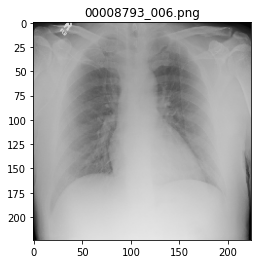

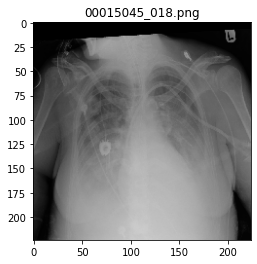

...

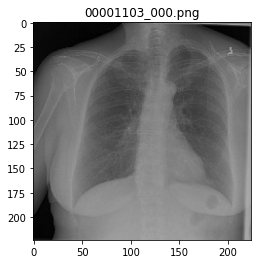

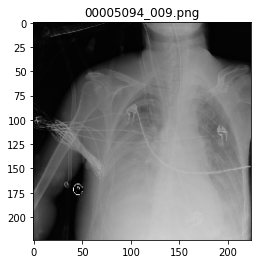

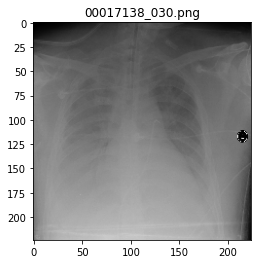

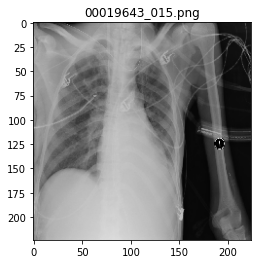

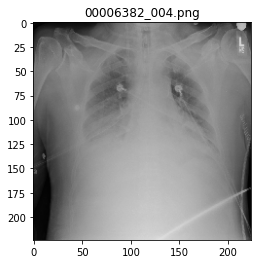

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
for i in range(16):
  _img = load_img(list(valid_df1.path)[i],target_size=(224,224))
  plt.imshow(_img)
  plt.title(list(valid_df1.idx)[i])
  plt.show()

11888    00019373_025.png
14563    00025635_004.png
8893     00014753_002.png
8383     00014070_000.png
6936     00011879_000.png
11636    00019031_001.png
3502     00006380_000.png
9151     00015196_000.png
2316     00004436_010.png
16437    00029658_000.png
6591     00011355_057.png
9131     00015167_002.png
2314     00004436_008.png
9285     00015465_000.png
15066    00026573_004.png
6242     00010795_000.png
Name: idx, dtype: object
Found 16 validated image filenames belonging to 8 classes.


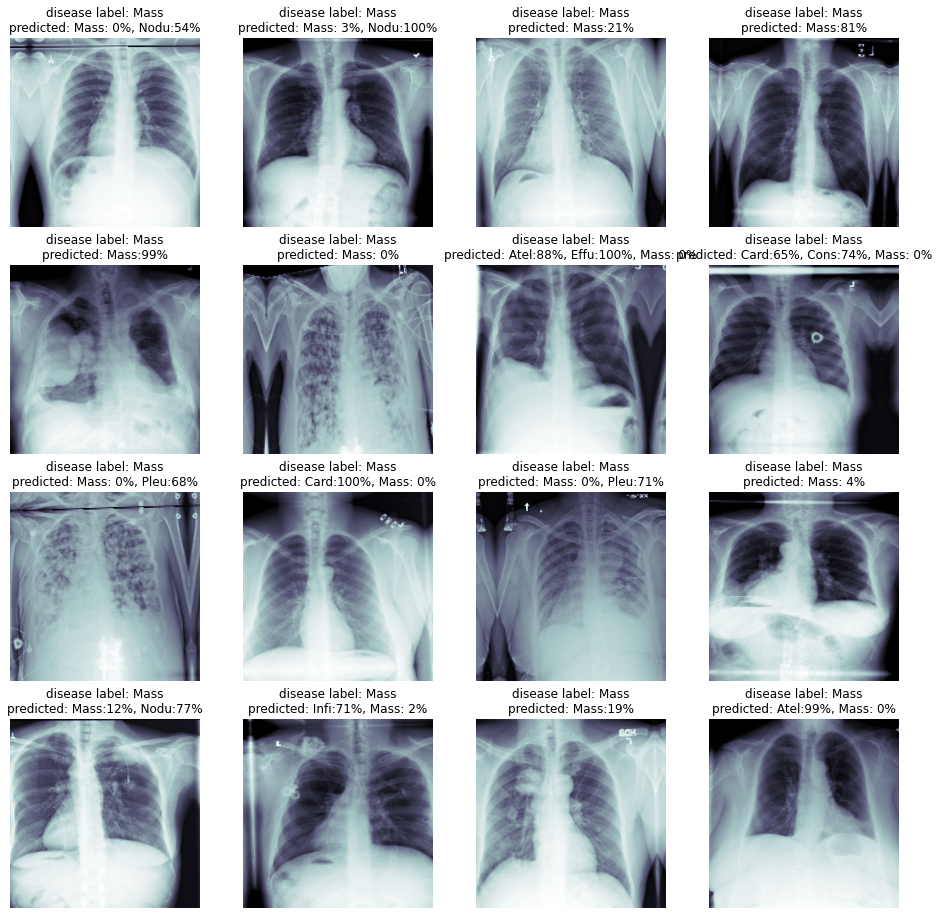

In [ ]:
# for Mass
valid_df1 = valid_df[valid_df.disease == "Mass"].sample(n=16, random_state=5)
print(valid_df1.idx.head(16))
test_X2, test_Y2 = next(core_idg.flow_from_dataframe(dataframe=valid_df1,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))
y_pred4 = model.predict(test_X2)

sickest_idx = np.argsort(np.sum(test_Y2, 1)<1)
fig, m_axs = plt.subplots(4, 4, figsize = (16, 16))
for (idx, c_ax) in zip(sickest_idx, m_axs.flatten()):
    c_ax.imshow(test_X2[idx, :,:,0], cmap = 'bone')
    stat_str = [n_class[:6] for n_class, n_score in zip(labels, 
                                                                  test_Y2[idx]) 
                             if n_score>0.5]
    pred_str = ['%s:%2.0f%%' % (n_class[:4], p_score*100)  for n_class, n_score, p_score in zip(labels, 
                                                                  test_Y2[idx], y_pred4[idx]) 
                             if (n_score>0.5) or (p_score>0.5)]
    c_ax.set_title('disease label: '+', '.join(stat_str)+'\npredicted: '+', '.join(pred_str))
    c_ax.axis('off')




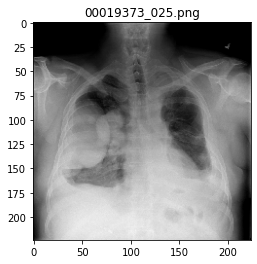

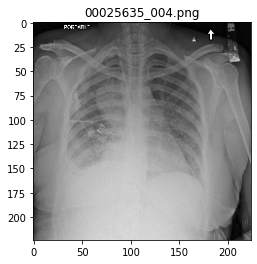

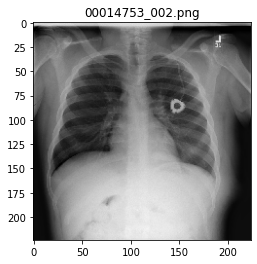

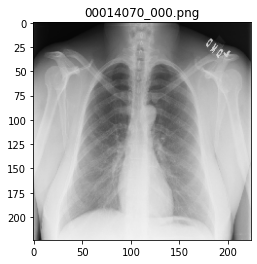

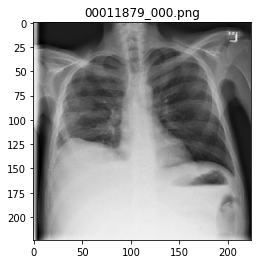

...

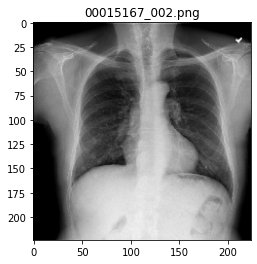

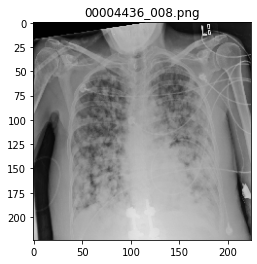

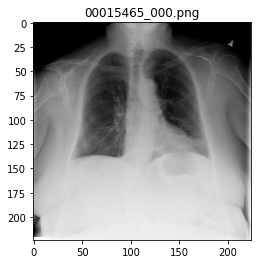

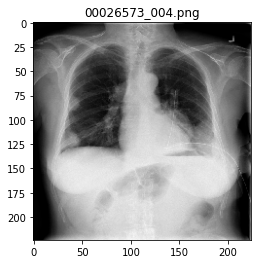

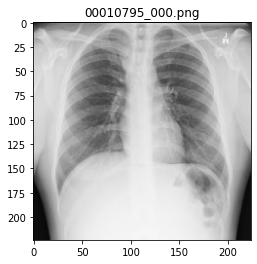

In [ ]:
from keras.preprocessing.image import load_img, img_to_array
for i in range(16):
  _img = load_img(list(valid_df1.path)[i],target_size=(224,224))
  plt.imshow(_img)
  plt.title(list(valid_df1.idx)[i])
  plt.show()

## train 48 layers No.3 - less augmentation

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
______________________________________________________________________________________________

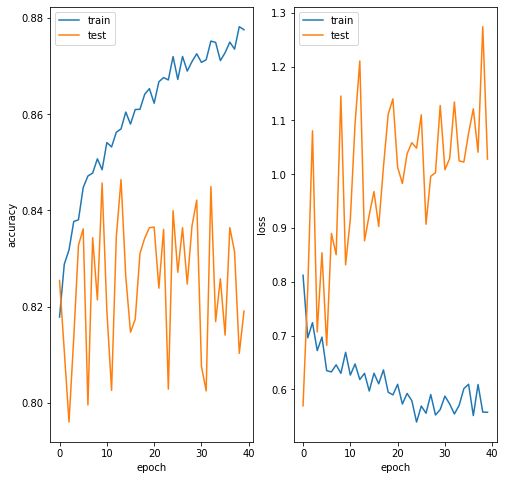

Epoch 1/20
324/324 [==============================] - ETA: 0s - loss: 1.1327 - binary_accuracy: 0.8625 - auc: 0.7410
Epoch 00001: loss improved from inf to 1.13267, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_23p2/model_23.h5
324/324 [==============================] - 302s 933ms/step - loss: 1.1327 - binary_accuracy: 0.8625 - auc: 0.7410 - val_loss: 1.9258 - val_binary_accuracy: 0.8141 - val_auc: 0.5947
Epoch 2/20
324/324 [==============================] - ETA: 0s - loss: 0.9154 - binary_accuracy: 0.8704 - auc: 0.7709
Epoch 00002: loss improved from 1.13267 to 0.91537, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_23p2/model_23.h5
324/324 [==============================] - 294s 906ms/step - loss: 0.9154 - binary_accuracy: 0.8704 - auc: 0.7709 - val_loss: 1.8475 - val_binary_accuracy: 0.8201 - val_auc: 0.6060
Epoch 3/20
324/324 [==============================] - ETA: 0s - loss: 0.8143 - binary_accuracy: 0.8757 - auc: 0.

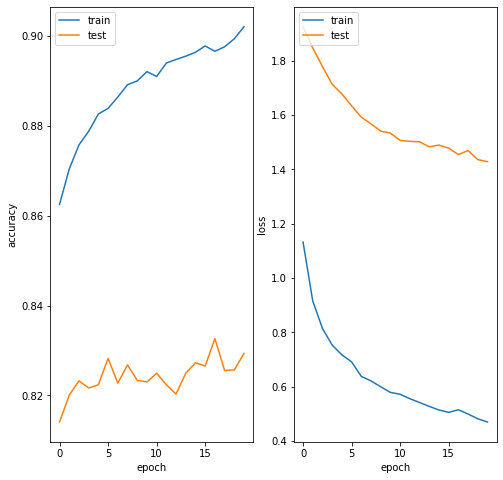

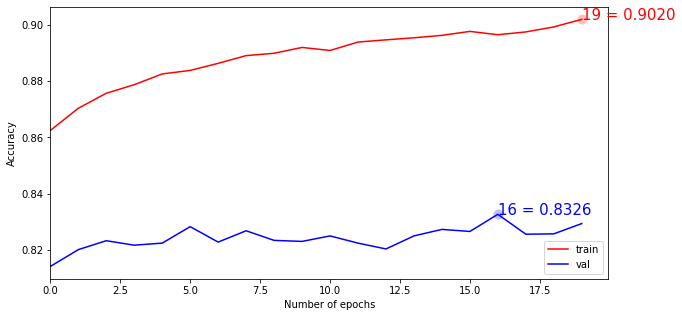

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_23/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_23/model_23.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=40, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers[:-48]:
    layer.trainable=False
    
for layer in model.layers[-48:]:
    layer.trainable=True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_23p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_23p2/model_23.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
# model = keras.models.load_model('/content/gdrive/My Drive/w210_capstone/balance_age_model/model_23p2/model_23.h5')

y_pred5 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred5, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.09%, predicted: 14.24%
Cardiomegaly: actual: 6.64%, predicted: 8.50%
Consolidation: actual: 8.30%, predicted: 9.86%
Effusion: actual: 16.80%, predicted: 15.00%
Infiltration: actual: 14.16%, predicted: 12.00%
Mass: actual: 16.60%, predicted: 13.10%
Nodule: actual: 13.67%, predicted: 11.50%
Pleural_Thickening: actual: 6.74%, predicted: 8.91%


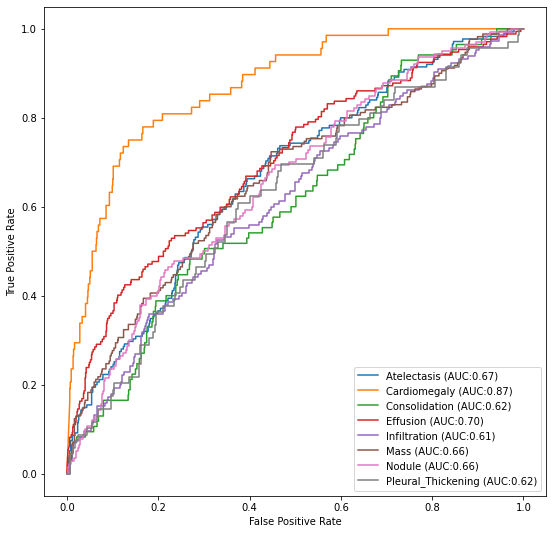

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred5[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

### 2. fine-tuning best

Model: "model_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_4 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_6 (ZeroPadding2D (None, 230, 230, 3)  0           input_4[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_6[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

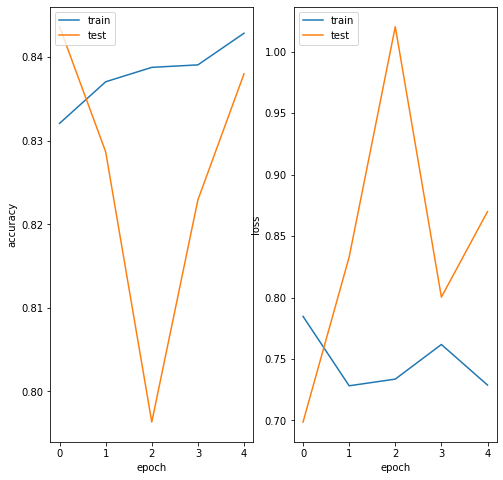

Epoch 1/50
374/374 [==============================] - ETA: 0s - loss: 1.1641 - binary_accuracy: 0.8263 - auc: 0.5632
Epoch 00001: loss improved from inf to 1.16407, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_5p2/model_5.h5
374/374 [==============================] - 315s 843ms/step - loss: 1.1641 - binary_accuracy: 0.8263 - auc: 0.5632 - val_loss: 1.1194 - val_binary_accuracy: 0.8175 - val_auc: 0.5769
Epoch 2/50
374/374 [==============================] - ETA: 0s - loss: 0.7961 - binary_accuracy: 0.8319 - auc: 0.6083
Epoch 00002: loss improved from 1.16407 to 0.79615, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_5p2/model_5.h5
374/374 [==============================] - 312s 835ms/step - loss: 0.7961 - binary_accuracy: 0.8319 - auc: 0.6083 - val_loss: 0.8366 - val_binary_accuracy: 0.8161 - val_auc: 0.5954
Epoch 3/50
374/374 [==============================] - ETA: 0s - loss: 0.5930 - binary_accuracy: 0.8427 - auc: 0.6422

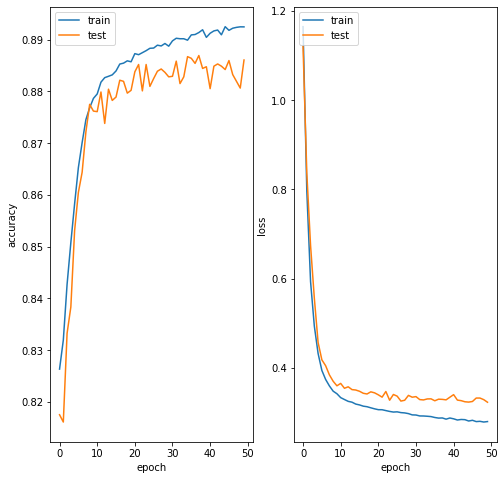

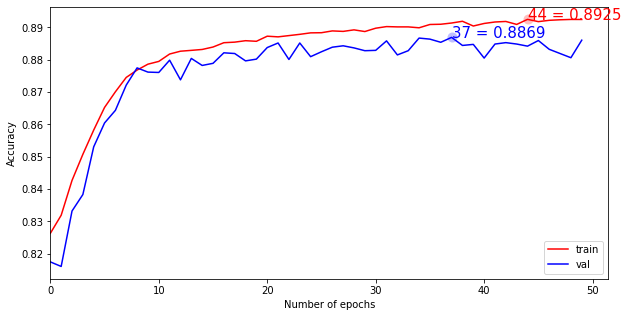

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_5/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_5/model_5.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers:
   layer.trainable = True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_5p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_5p2/model_5.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
y_pred2 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred2, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 12.89%, predicted: 11.11%
Cardiomegaly: actual: 7.13%, predicted: 7.16%
Consolidation: actual: 8.20%, predicted: 13.42%
Effusion: actual: 13.57%, predicted: 14.25%
Infiltration: actual: 12.21%, predicted: 11.56%
Mass: actual: 13.09%, predicted: 13.26%
Nodule: actual: 12.79%, predicted: 8.14%
Normal: actual: 12.99%, predicted: 11.84%
Pleural_Thickening: actual: 7.13%, predicted: 9.00%


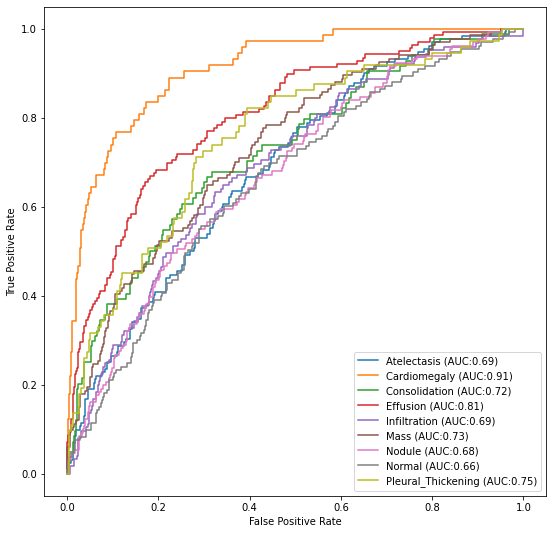

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred2[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred2)))

ROC auc score: 0.738


### More augmention

In [ ]:
%%time
core_idg = ImageDataGenerator(rescale=1 / 255,
                                  samplewise_center=True,
                                  samplewise_std_normalization=True,
                                  horizontal_flip=True,
                                  vertical_flip=False,
                                  height_shift_range=0.05,
                                  width_shift_range=0.1,
                                  rotation_range=2.5,
                                  shear_range=0.1,
                                  fill_mode='reflect',
                                  zoom_range=0.15)

train_gen = core_idg.flow_from_dataframe(dataframe=train_df,
                                             directory=None,
                                             x_col='path',
                                             y_col='labels',
                                             class_mode='categorical',
                                             batch_size=batch_size,
                                             classes=labels,
                                             target_size=(image_size, image_size))

# valid_gen = core_idg.flow_from_dataframe(dataframe=valid_df,
#                                              directory=None,
#                                              x_col='path',
#                                              y_col='labels',
#                                              class_mode='categorical',
#                                              batch_size=batch_size,
#                                              classes=labels,
#                                              target_size=(image_size, image_size))

test_X, test_Y = next(core_idg.flow_from_dataframe(dataframe=valid_df,
                                                       directory=None,
                                                       x_col='path',
                                                       y_col='labels',
                                                       class_mode='categorical',
                                                       batch_size=1024,
                                                       classes=labels,
                                                       target_size=(image_size, image_size)))

Found 11966 validated image filenames belonging to 9 classes.
Found 2992 validated image filenames belonging to 9 classes.
CPU times: user 26.6 s, sys: 2 s, total: 28.6 s
Wall time: 3min 51s


Model: "model_4"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d_8 (ZeroPadding2D (None, 230, 230, 3)  0           input_5[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d_8[0][0]           
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
____________________________________________________________________________________________

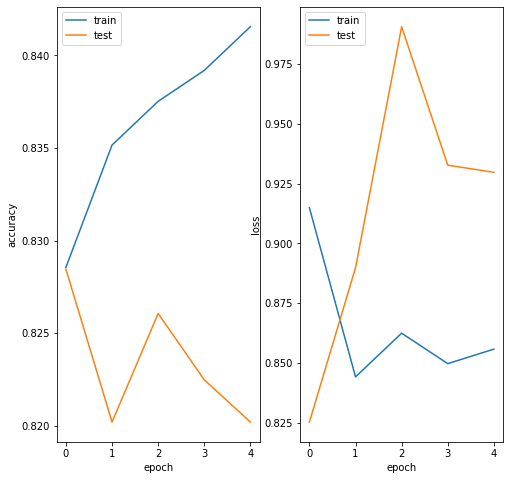

Epoch 1/50
374/374 [==============================] - ETA: 0s - loss: 1.0528 - binary_accuracy: 0.8295 - auc: 0.5895
Epoch 00001: loss improved from inf to 1.05275, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/model_6.h5
374/374 [==============================] - 324s 866ms/step - loss: 1.0528 - binary_accuracy: 0.8295 - auc: 0.5895 - val_loss: 1.0682 - val_binary_accuracy: 0.8148 - val_auc: 0.5924
Epoch 2/50
374/374 [==============================] - ETA: 0s - loss: 0.8597 - binary_accuracy: 0.8328 - auc: 0.6197
Epoch 00002: loss improved from 1.05275 to 0.85975, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/model_6.h5
374/374 [==============================] - 319s 852ms/step - loss: 0.8597 - binary_accuracy: 0.8328 - auc: 0.6197 - val_loss: 0.9200 - val_binary_accuracy: 0.8350 - val_auc: 0.6151
Epoch 3/50
374/374 [==============================] - ETA: 0s - loss: 0.6826 - binary_accuracy: 0.8408 - auc: 0.6454

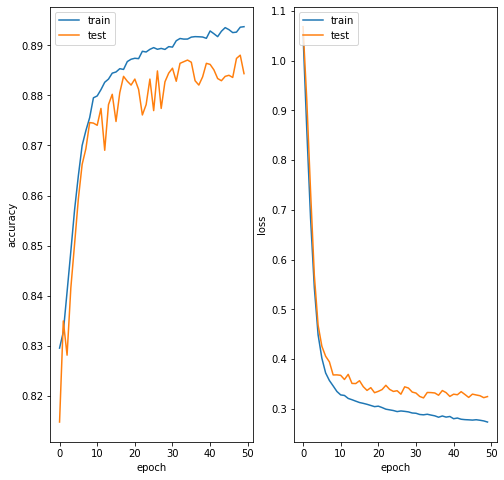

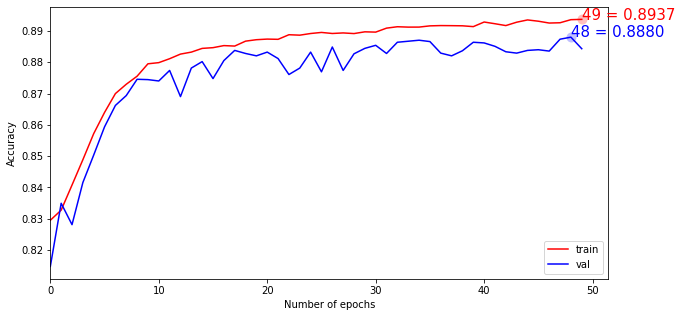

In [ ]:
# https://keras.io/api/applications/ fine tune pretrained model

from tensorflow.keras.applications import DenseNet121
# pretrain_model_densenet121 = DenseNet121(weights = 'imagenet', include_top = False, input_shape=(img_size, img_size, 3))

# new_model, model_history = pretrainedNetwork(train_ds, valid_ds, pretrain_model_densenet121, class_weight_dict, 17, 50, optimizer_adam, map_dict)
# create the base pre-trained model
base_model = DenseNet121(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()
# this is the model we will train
# model = Model(inputs=base_model.input, outputs=predictions)

# first: train only the top layers (which were randomly initialized)
# i.e. freeze all convolutional InceptionV3 layers
for layer in base_model.layers:
    layer.trainable = False

# compile the model (should be done *after* setting layers to non-trainable)
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6/model_6.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
# model.summary()
# train the model on the new data for a few epochs
history = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=5, 
              callbacks = callbacks_list)


# plotkerasLearningCurve()
# plt.show()
plotLearningCurve(history)
plt.show()

# at this point, the top layers are well trained and we can start fine-tuning
# convolutional layers from inception V3. We will freeze the bottom N layers
# and train the remaining top layers.

# let's visualize layer names and layer indices to see how many layers
# we should freeze:
# for i, layer in enumerate(base_model.layers):
#    print(i, layer.name)

# we chose to train the top 2 inception blocks, i.e. we will freeze
# the first 249 layers and unfreeze the rest:
for layer in model.layers:
   layer.trainable = True


# we need to recompile the model for these modifications to take effect
# we use SGD with a low learning rate
from tensorflow.keras.optimizers import SGD
model.compile(optimizer=SGD(lr=0.0001, momentum=0.9), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_6p2/model_6.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]

# we train our model again (this time fine-tuning the top 2 inception blocks
# alongside the top Dense layers
history2 = model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=50, 
              callbacks = callbacks_list)
plotLearningCurve(history2)
plt.show()
plotkerasLearningCurve()
plt.show()


In [ ]:
y_pred3 = model.predict(test_X)

for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred3, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 12.99%, predicted: 10.57%
Cardiomegaly: actual: 7.13%, predicted: 10.10%
Consolidation: actual: 8.59%, predicted: 12.77%
Effusion: actual: 14.06%, predicted: 10.23%
Infiltration: actual: 13.18%, predicted: 13.43%
Mass: actual: 11.72%, predicted: 9.36%
Nodule: actual: 14.36%, predicted: 14.64%
Normal: actual: 12.70%, predicted: 11.52%
Pleural_Thickening: actual: 5.27%, predicted: 8.38%


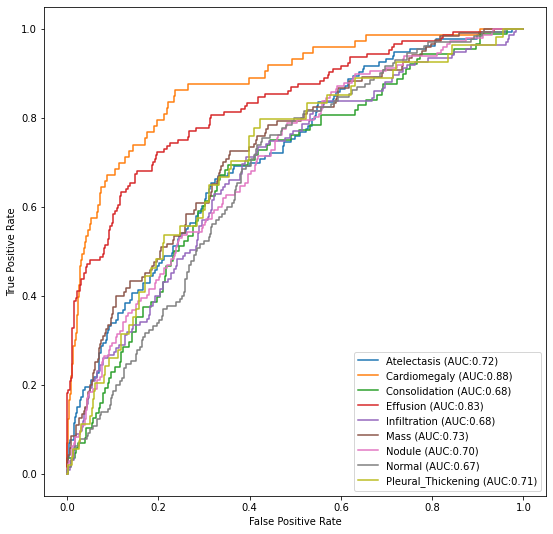

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred3[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred3)))

ROC auc score: 0.732


### Curtis original

In [ ]:
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.nasnet import NASNetMobile
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2

base_model = DenseNet121(include_top=False, weights='imagenet', input_shape=(224, 224, 3))
x = base_model.output
# x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Flatten()(x)
output = tf.keras.layers.Dense(len(labels), activation="sigmoid")(x)
model = tf.keras.Model(base_model.input, output)
model.compile(optimizer=tf.keras.optimizers.Adam(), loss='binary_crossentropy', metrics=['binary_accuracy', 'AUC'])
model.summary()

29089792/29084464 [==============================] - 0s 0us/step
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 224, 224, 3) 0                                            
__________________________________________________________________________________________________
zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1/conv (Conv2D)             (None, 112, 112, 64) 9408        zero_padding2d[0][0]             
__________________________________________________________________________________________________
conv1/bn (BatchNormalization)   (None, 112, 112, 64) 256         conv1/conv[0][0]                 
_____________________________

In [ ]:
def get_callbacks(model_name):
    callbacks = []
    tensor_board = tf.keras.callbacks.TensorBoard(log_dir='./logs', histogram_freq=0)
    callbacks.append(tensor_board)
    checkpoint = tf.keras.callbacks.ModelCheckpoint(
        filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_4/model_4.h5",
        verbose=1,
        save_best_only=True)
    # erly = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=3)
    callbacks.append(checkpoint)
    # callbacks.append(erly)
    return callbacks

In [ ]:
%%time
# callbacks = get_callbacks('densenet121-binary2')
logdir = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_4/logs/scalars/" + datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=logdir)    

# add checkpoint and model save
filepath = "/content/gdrive/My Drive/w210_capstone/balance_age_model/model_4/model_4.h5"
checkpoint = ModelCheckpoint(filepath, monitor='loss', verbose=1, save_best_only=True, mode='min')
callbacks_list = [MetricsCheckpoint('logs'), checkpoint, tensorboard_callback]
model.fit(train_gen,
              class_weight = class_weight_dict,
              validation_data=(test_X, test_Y),
              epochs=20, 
              callbacks=callbacks_list)

Epoch 1/20
Instructions for updating:
If using Keras pass *_constraint arguments to layers.
324/324 [==============================] - ETA: 0s - loss: 0.7749 - binary_accuracy: 0.8442 - auc: 0.5158 
Epoch 00001: loss improved from inf to 0.77489, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_4/model_4.h5
324/324 [==============================] - 4080s 13s/step - loss: 0.7749 - binary_accuracy: 0.8442 - auc: 0.5158 - val_loss: 6.4477 - val_binary_accuracy: 0.8032 - val_auc: 0.5448
Epoch 2/20
324/324 [==============================] - ETA: 0s - loss: 0.5146 - binary_accuracy: 0.8537 - auc: 0.5512
Epoch 00002: loss improved from 0.77489 to 0.51458, saving model to /content/gdrive/My Drive/w210_capstone/balance_age_model/model_4/model_4.h5
324/324 [==============================] - 248s 765ms/step - loss: 0.5146 - binary_accuracy: 0.8537 - auc: 0.5512 - val_loss: 0.4152 - val_binary_accuracy: 0.8640 - val_auc: 0.5767
Epoch 3/20
324/324 [===================

In [ ]:
y_pred = model.predict(test_X)

In [ ]:
for label, p_count, t_count in zip(labels,
                                     100 * np.mean(y_pred, 0),
                                     100 * np.mean(test_Y, 0)):
    print('%s: actual: %2.2f%%, predicted: %2.2f%%' % (label, t_count, p_count))

Atelectasis: actual: 17.19%, predicted: 12.02%
Cardiomegaly: actual: 6.93%, predicted: 9.91%
Consolidation: actual: 7.52%, predicted: 15.54%
Effusion: actual: 17.38%, predicted: 10.52%
Infiltration: actual: 12.89%, predicted: 15.16%
Mass: actual: 16.99%, predicted: 13.82%
Nodule: actual: 13.87%, predicted: 11.70%
Pleural_Thickening: actual: 7.23%, predicted: 9.92%


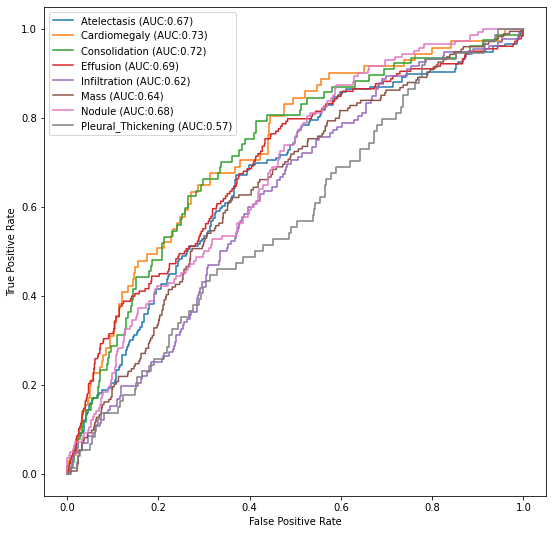

In [ ]:
fig, c_ax = plt.subplots(1, 1, figsize=(9, 9))
for (idx, c_label) in enumerate(labels):
    fpr, tpr, thresholds = roc_curve(test_Y[:, idx].astype(int), y_pred[:, idx])
    c_ax.plot(fpr, tpr, label='%s (AUC:%0.2f)' % (c_label, auc(fpr, tpr)))
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
fig.savefig('trained_net.png')

In [ ]:
print('ROC auc score: {:.3f}'.format(roc_auc_score(test_Y.astype(int), y_pred)))

ROC auc score: 0.664
